# Code used to generate profile picture

In [1]:


from PIL import Image, ImageDraw, ImageFilter, ImageChops, ImageEnhance, ImageOps
import numpy as np
import math
import random

# --------------------------
# Config
# --------------------------
BASE = 1024                         # design baseline
SIZE = 3072                         # render size (increase for more detail)
FINAL = 1440                        # delivery size (downscale target)
DPI = 500                           # save metadata for print
SCALE = SIZE / BASE
RADIUS = SIZE // 2
SEED = 1337

SAVE_NAME = "qubitink_avatar_vibrant_HR.png"
SAVE_NAME_CIRCLE = "qubitink_avatar_vibrant_HR_circle.png"
SAVE_NAME_FINAL = f"qubitink_avatar_vibrant_{FINAL}.png"
SAVE_NAME_FINAL_CIRCLE = f"qubitink_avatar_vibrant_{FINAL}_circle.png"

# Base palette
BG_INNER = (14, 20, 40)
BG_OUTER = (6, 10, 22)

# Strength knobs
FILAMENT_ALPHA = 170
PARTICLE_ALPHA_MIN, PARTICLE_ALPHA_MAX = 130, 220
ANGULAR_RAINBOW_STRENGTH = 0.35
SPECTRAL_NOISE_STRENGTH = 0.22
GLOBAL_VIBRANCE = 1.35
GLOBAL_CONTRAST = 1.08
GLOBAL_BRIGHTNESS = 1.03
CHROMA_SHIFT = int(1 * SCALE)

# Scaled counts
NUM_FILAMENTS = max(18, int(18 * (SCALE ** 0.9)))
NUM_PARTICLES = max(420, int(420 * (SCALE ** 1.2)))

random.seed(SEED)
np.random.seed(SEED)

def radial_gradient(size, inner_rgb, outer_rgb, power=1.8):
    w = h = size
    cx = cy = size / 2
    y, x = np.ogrid[:h, :w]
    r = np.sqrt((x - cx) ** 2 + (y - cy) ** 2) / (math.sqrt(2) * size / 2)
    r = np.clip(r, 0, 1) ** power
    arr = np.zeros((h, w, 3), dtype=np.float32)
    for i in range(3):
        arr[..., i] = inner_rgb[i] * (1 - r) + outer_rgb[i] * r
    return Image.fromarray(np.uint8(arr))

def hsv_to_rgb_np(h, s, v):
    # h,s,v in [0,1]; vectorized
    i = np.floor(h * 6).astype(int)
    f = h * 6 - i
    p = v * (1 - s)
    q = v * (1 - f * s)
    t = v * (1 - (1 - f) * s)
    i_mod = np.mod(i, 6)

    r = np.choose(i_mod, [v, q, p, p, t, v])
    g = np.choose(i_mod, [t, v, v, q, p, p])
    b = np.choose(i_mod, [p, p, t, v, v, q])
    rgb = np.stack([r, g, b], axis=-1)
    return (np.clip(rgb, 0, 1) * 255).astype(np.uint8)

def blend_add(base, layer):
    return ImageChops.add(base, layer, scale=1.0, offset=0)

def lissajous_path(a, b, delta, scale, samples):
    t = np.linspace(0, 2 * np.pi, samples, endpoint=False)
    x = np.sin(a * t + delta) * scale
    y = np.sin(b * t) * scale
    return np.stack([x, y], axis=1)

def draw_gradient_polyline(img, points, width, hue_start, hue_end, sat=0.9, val=1.0, alpha=FILAMENT_ALPHA):
    dr = ImageDraw.Draw(img)
    n = len(points)
    for i in range(n - 1):
        t = i / (n - 1)
        h = (hue_start + t * ((hue_end - hue_start + 1.5) % 1.0)) % 1.0
        r, g, b = hsv_to_rgb_np(np.array(h), np.array(sat), np.array(val)).tolist()
        col = (int(r), int(g), int(b), int(alpha))
        dr.line([points[i], points[i + 1]], fill=col, width=width)

base = radial_gradient(SIZE, BG_INNER, BG_OUTER, power=1.6).convert("RGBA")

noise = np.random.rand(SIZE, SIZE)
stars = Image.fromarray(np.uint8((noise > 0.996) * 255), mode="L").filter(
    ImageFilter.GaussianBlur(0.6 * SCALE)
)
stars_col = Image.new("RGBA", (SIZE, SIZE), (230, 240, 255, 0))
stars_col.putalpha(stars.point(lambda v: int(v * 0.7)))
base = Image.alpha_composite(base, stars_col)

yy, xx = np.mgrid[0:SIZE, 0:SIZE]
cx = cy = RADIUS
ang = np.arctan2(yy - cy, xx - cx)
ang_norm = (ang + np.pi) / (2 * np.pi)
rad = np.sqrt((xx - cx) ** 2 + (yy - cy) ** 2) / RADIUS
sat = np.clip(0.2 + 0.9 * (1 - rad ** 1.4), 0, 1)
val = np.clip(0.7 + 0.3 * (1 - rad ** 2.0), 0, 1)

rgb = hsv_to_rgb_np(ang_norm, sat, val)
rainbow = Image.fromarray(rgb, mode="RGB").convert("RGBA")
rainbow = rainbow.filter(ImageFilter.GaussianBlur(2 * SCALE))
rainbow.putalpha(int(255 * ANGULAR_RAINBOW_STRENGTH))
base = Image.alpha_composite(base, rainbow)

fx = 2.5 * (xx / SIZE) + 0.5 * np.sin(yy / (43.0 * SCALE) + 0.0)
fy = 2.5 * (yy / SIZE) + 0.5 * np.sin(xx / (57.0 * SCALE) + 1.7)
phase = (np.sin(2 * np.pi * fx) + np.cos(2 * np.pi * fy)) * 0.5
phase = (phase - phase.min()) / (phase.max() - phase.min())

hue = (phase * 0.85 + 0.05) % 1.0
sat2 = 0.6 * (1 - (rad ** 1.3)) + 0.15
val2 = 0.35 + 0.65 * (1 - (rad ** 1.6))
rgb2 = hsv_to_rgb_np(hue, sat2, val2)

spectral = Image.fromarray(rgb2, mode="RGB").convert("RGBA")
spectral = spectral.filter(ImageFilter.GaussianBlur(3 * SCALE))
spectral.putalpha(int(255 * SPECTRAL_NOISE_STRENGTH))
base = Image.alpha_composite(base, spectral)

center = np.array([RADIUS, RADIUS], dtype=float)
filament_layer = Image.new("RGBA", (SIZE, SIZE), (0, 0, 0, 0))

for _ in range(NUM_FILAMENTS):
    a = random.randint(2, 7)
    b = random.randint(3, 8)
    delta = random.random() * np.pi
    scale = random.uniform(0.22, 0.44) * SIZE
    samples = int(2400 * SCALE)
    path = lissajous_path(a, b, delta, scale, samples)

    theta = random.random() * 2 * np.pi
    cos_t, sin_t = math.cos(theta), math.sin(theta)
    rot = np.empty_like(path)
    rot[:, 0] = path[:, 0] * cos_t - path[:, 1] * sin_t + center[0]
    rot[:, 1] = path[:, 0] * sin_t + path[:, 1] * cos_t + center[1]

    pts = [tuple(p) for p in rot]
    pts_mirror = [tuple((2 * center - p)) for p in rot]

    w = max(2, int(random.randint(2, 4) * SCALE))
    h0 = random.random()
    h1 = (h0 + random.uniform(0.25, 0.75)) % 1.0

    draw_gradient_polyline(filament_layer, pts, w, h0, h1, sat=0.95, val=1.0, alpha=FILAMENT_ALPHA)
    draw_gradient_polyline(filament_layer, pts_mirror, w, h1, h0, sat=0.95, val=1.0, alpha=int(FILAMENT_ALPHA * 0.9))

filament_layer = filament_layer.filter(ImageFilter.GaussianBlur(1.2 * SCALE))
base = Image.alpha_composite(base, filament_layer)

dot_layer = Image.new("RGBA", (SIZE, SIZE), (0, 0, 0, 0))

def soft_dot(x, y, r, col, alpha):
    d = Image.new("RGBA", (int(2 * r), int(2 * r)), (0, 0, 0, 0))
    dr = ImageDraw.Draw(d)
    dr.ellipse([0, 0, 2 * r, 2 * r], fill=col + (alpha,))
    return d.filter(ImageFilter.GaussianBlur(r * 0.6))

for _ in range(NUM_PARTICLES):
    ang0 = random.random() * 2 * np.pi
    rr = random.uniform(SIZE * 0.12, SIZE * 0.46)
    x = RADIUS + rr * math.cos(ang0)
    y = RADIUS + rr * math.sin(ang0)
    mx = 2 * RADIUS - x
    my = 2 * RADIUS - y

    hue0 = (ang0 / (2 * np.pi)) % 1.0
    sat0 = 0.7 + 0.3 * random.random()
    val0 = 0.9
    col = tuple(hsv_to_rgb_np(np.array(hue0), np.array(sat0), np.array(val0)).tolist())

    rdot = random.uniform(2.2, 4.8) * SCALE
    a = random.randint(PARTICLE_ALPHA_MIN, PARTICLE_ALPHA_MAX)

    d1 = soft_dot(x, y, rdot, col, a)
    dot_layer.paste(d1, (int(x - rdot), int(y - rdot)), d1)

    hue2 = (hue0 + 0.5) % 1.0
    col2 = tuple(hsv_to_rgb_np(np.array(hue2), np.array(sat0), np.array(val0)).tolist())
    d2 = soft_dot(mx, my, rdot * random.uniform(0.9, 1.1), col2, a)
    dot_layer.paste(d2, (int(mx - rdot), int(my - rdot)), d2)

dot_layer = dot_layer.filter(ImageFilter.GaussianBlur(0.7 * SCALE))
base = blend_add(base, dot_layer)

ring_layer = Image.new("RGBA", (SIZE, SIZE), (0, 0, 0, 0))
dr = ImageDraw.Draw(ring_layer)
outer = int(SIZE * 0.64)
inner = int(SIZE * 0.46)
for k in range(18):
    t = k / 18.0
    c = int(255 * (0.35 + 0.65 * (1 - t)))
    col = (c, c, c, int(150 * (1 - t)))
    r1 = int(inner + (outer - inner) * t)
    dr.ellipse([RADIUS - r1, RADIUS - r1, RADIUS + r1, RADIUS + r1],
               outline=col, width=max(2, int(2 * SCALE)))
ring_layer = ring_layer.filter(ImageFilter.GaussianBlur(1.8 * SCALE))
base = Image.alpha_composite(base, ring_layer)

mono = Image.new("RGBA", (SIZE, SIZE), (0, 0, 0, 0))
md = ImageDraw.Draw(mono)
TEXT_FILL = (245, 250, 255)

q_r = int(SIZE * 0.145)
q_cx = int(SIZE * 0.42)
q_cy = int(SIZE * 0.48)
stroke = int(0.022 * SIZE)
md.ellipse([q_cx - q_r, q_cy - q_r, q_cx + q_r, q_cy + q_r],
           outline=TEXT_FILL + (255,), width=stroke)
tail_len = int(q_r * 0.95)
tail_w = stroke
tail_ang = -0.6
tx1 = q_cx + int(q_r * math.cos(tail_ang))
ty1 = q_cy + int(q_r * math.sin(tail_ang))
tx2 = tx1 + int(tail_len * math.cos(tail_ang))
ty2 = ty1 + int(tail_len * math.sin(tail_ang))
md.line([(tx1, ty1), (tx2, ty2)], fill=TEXT_FILL + (255,), width=tail_w)

i_h = int(SIZE * 0.34)
i_w = int(SIZE * 0.06)
i_cx = int(SIZE * 0.60)
i_cy = int(SIZE * 0.48)
rx0 = i_cx - i_w // 2
ry0 = i_cy - i_h // 2
rx1 = i_cx + i_w // 2
ry1 = i_cy + i_h // 2
md.rounded_rectangle([rx0, ry0, rx1, ry1], radius=i_w // 2,
                     outline=TEXT_FILL + (255,), width=stroke)

mono_blur = mono.filter(ImageFilter.GaussianBlur(3 * SCALE))
glow = Image.new("RGBA", (SIZE, SIZE), (255, 255, 255, 0))
glow.putalpha(mono_blur.split()[-1])
base = Image.alpha_composite(base, glow)
base = Image.alpha_composite(base, mono)

def draw_tiny_caps(draw, text, x, y, size, color):
    cell = size
    w = int(cell * 0.14)
    for idx, ch in enumerate(text.lower()):
        cx = x + idx * int(cell * 0.72)
        cy = y
        if ch == " ":
            continue
        if ch == "q":
            r = int(cell * 0.32)
            draw.ellipse([cx - r, cy - r, cx + r, cy + r], outline=color, width=w)
            draw.line([cx + r // 2, cy + r // 2, cx + r, cy + r], fill=color, width=w)
        elif ch == "u":
            r = int(cell * 0.28)
            draw.arc([cx - r, cy - r, cx + r, cy + r], start=20, end=160, fill=color, width=w)
            draw.line([cx - r, cy, cx - r, cy - r], fill=color, width=w)
            draw.line([cx + r, cy, cx + r, cy - r], fill=color, width=w)
        elif ch == "b":
            draw.line([cx - int(cell * 0.35), cy - int(cell * 0.45),
                       cx - int(cell * 0.35), cy + int(cell * 0.45)], fill=color, width=w)
            draw.arc([cx - int(cell * 0.35), cy - int(cell * 0.05),
                      cx + int(cell * 0.25), cy + int(cell * 0.45)], start=270, end=90, fill=color, width=w)
        elif ch == "i":
            draw.line([cx, cy - int(cell * 0.45), cx, cy + int(cell * 0.45)], fill=color, width=w)
            draw.ellipse([cx - int(w * 0.9), cy - int(cell * 0.62) - int(w * 0.9),
                          cx + int(w * 0.9), cy - int(cell * 0.62) + int(w * 0.9)], fill=color)
        elif ch == "t":
            draw.line([cx, cy - int(cell * 0.5), cx, cy + int(cell * 0.42)], fill=color, width=w)
            draw.line([cx - int(cell * 0.28), cy - int(cell * 0.45),
                       cx + int(cell * 0.28), cy - int(cell * 0.45)], fill=color, width=w)
        elif ch == "n":
            draw.line([cx - int(cell * 0.35), cy + int(cell * 0.45),
                       cx - int(cell * 0.35), cy - int(cell * 0.45)], fill=color, width=w)
            draw.arc([cx - int(cell * 0.35), cy - int(cell * 0.45),
                      cx + int(cell * 0.35), cy + int(cell * 0.45)], start=180, end=360, fill=color, width=w)
        elif ch == "k":
            draw.line([cx - int(cell * 0.35), cy - int(cell * 0.45),
                       cx - int(cell * 0.35), cy + int(cell * 0.45)], fill=color, width=w)
            draw.line([cx - int(cell * 0.35), cy, cx + int(cell * 0.35), cy - int(cell * 0.45)], fill=color, width=w)
            draw.line([cx - int(cell * 0.35), cy, cx + int(cell * 0.35), cy + int(cell * 0.45)], fill=color, width=w)

label_layer = Image.new("RGBA", (SIZE, SIZE), (0, 0, 0, 0))
ld = ImageDraw.Draw(label_layer)
label_size = int(0.06 * SIZE)
ld_color = (245, 250, 255, 220)
draw_tiny_caps(ld, "qubit ink", int(SIZE * 0.33), int(SIZE * 0.74), label_size, ld_color)
label_layer = label_layer.filter(ImageFilter.GaussianBlur(0.4 * SCALE))
base = Image.alpha_composite(base, label_layer)

img = base.convert("RGB")
img = ImageEnhance.Color(img).enhance(GLOBAL_VIBRANCE)
img = ImageEnhance.Contrast(img).enhance(GLOBAL_CONTRAST)
img = ImageEnhance.Brightness(img).enhance(GLOBAL_BRIGHTNESS)
img = img.convert("RGBA")

r, g, b, a = img.split()
if CHROMA_SHIFT:
    r = ImageChops.offset(r, CHROMA_SHIFT, 0)
    b = ImageChops.offset(b, -CHROMA_SHIFT, 0)
img = Image.merge("RGBA", (r, g, b, a))

mask = Image.new("L", (SIZE, SIZE), 0)
mdd = ImageDraw.Draw(mask)
mdd.ellipse([0, 0, SIZE, SIZE], fill=255)
circ = img.copy()
circ.putalpha(mask)
circ = circ.filter(ImageFilter.GaussianBlur(0.3 * SCALE))

img.save(SAVE_NAME, "PNG", dpi=(DPI, DPI))
circ.save(SAVE_NAME_CIRCLE, "PNG", dpi=(DPI, DPI))

final_sq = img.resize((FINAL, FINAL), resample=Image.Resampling.LANCZOS)
final_circ = circ.resize((FINAL, FINAL), resample=Image.Resampling.LANCZOS)
final_sq.save(SAVE_NAME_FINAL, "PNG", dpi=(DPI, DPI))
final_circ.save(SAVE_NAME_FINAL_CIRCLE, "PNG", dpi=(DPI, DPI))



/tmp/ipykernel_13664/1965357994.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('hsv')


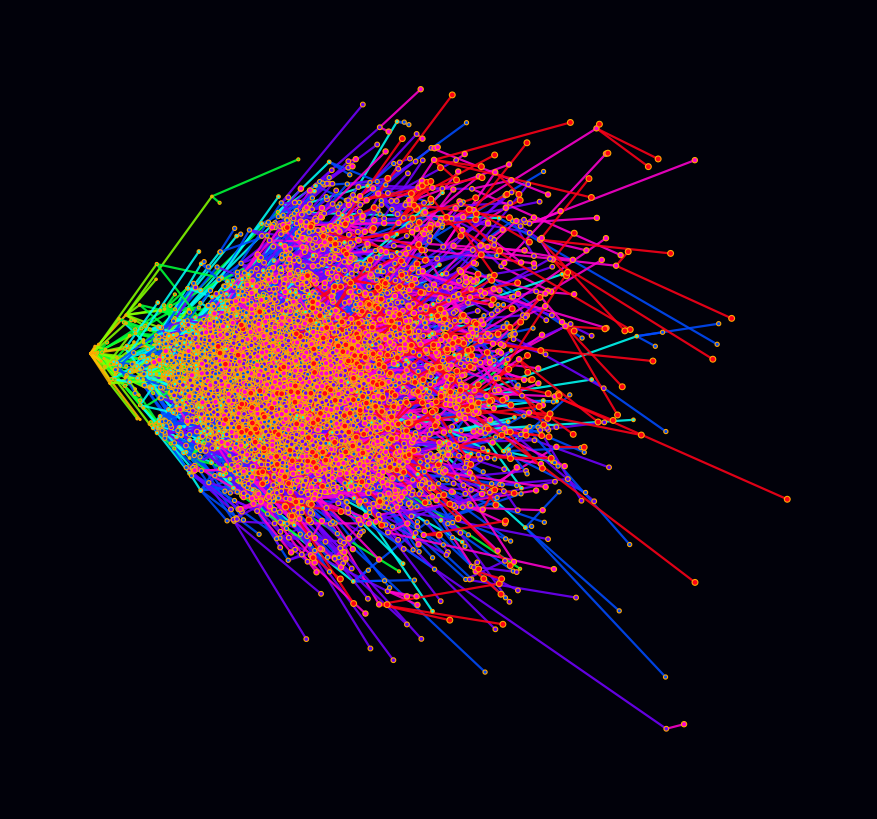

In [2]:
import numpy as np, matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

rng = np.random.default_rng(50)
N, G, branch = 5000000, 9, 2          
pos = np.zeros((N, 2))
age = np.zeros(N, int)
parent = -np.ones(N, int)

pos[0] = [0, 0]
alive = 1
for gen in range(1, G):
    start = alive
    for i in range(start):
        kids = rng.poisson(branch)
        for _ in range(kids):
            if alive >= N: break
            theta = rng.uniform(-np.pi/3, np.pi/3)
            length = rng.exponential(0.92)
            pos[alive] = pos[i] + length * np.array([np.cos(theta), np.sin(theta)])
            parent[alive] = i
            age[alive] = age[i] + 1
            alive += 1

cmap = plt.cm.get_cmap('hsv')
norm = plt.Normalize(0,8)

fig, ax = plt.subplots(figsize=(10,8))
fig.patch.set_facecolor("#01010a")
ax.set_facecolor("#010112")
ax.axis('off')

segments, colors = [], []
for i in range(1, alive):
    p = parent[i]
    segments.append([pos[p], pos[i]])
    rgba = cmap(norm(age[i]))
    colors.append(rgba[:3] + (0.88,))

lc = LineCollection(segments, colors=colors, linewidths=1.6, capstyle='round')
ax.add_collection(lc)

hue = age[:alive] / 10
sz  = 1 + 4 * hue
ax.scatter(pos[:alive,0], pos[:alive,1],
           s=sz**2, c=hue, cmap='hsv',
           edgecolors='orange', linewidths=0.8,
           alpha=1, zorder=9)

margin = 1.5
ax.set_xlim(pos[:alive,0].min()-margin, pos[:alive,0].max()+margin)
ax.set_ylim(pos[:alive,1].min()-margin, pos[:alive,1].max()+margin)
ax.set_aspect('equal')
plt.tight_layout(pad=0)
plt.savefig('quantum_universes_colored.png', dpi=600,
            facecolor=fig.get_facecolor(), bbox_inches='tight')
plt.show()

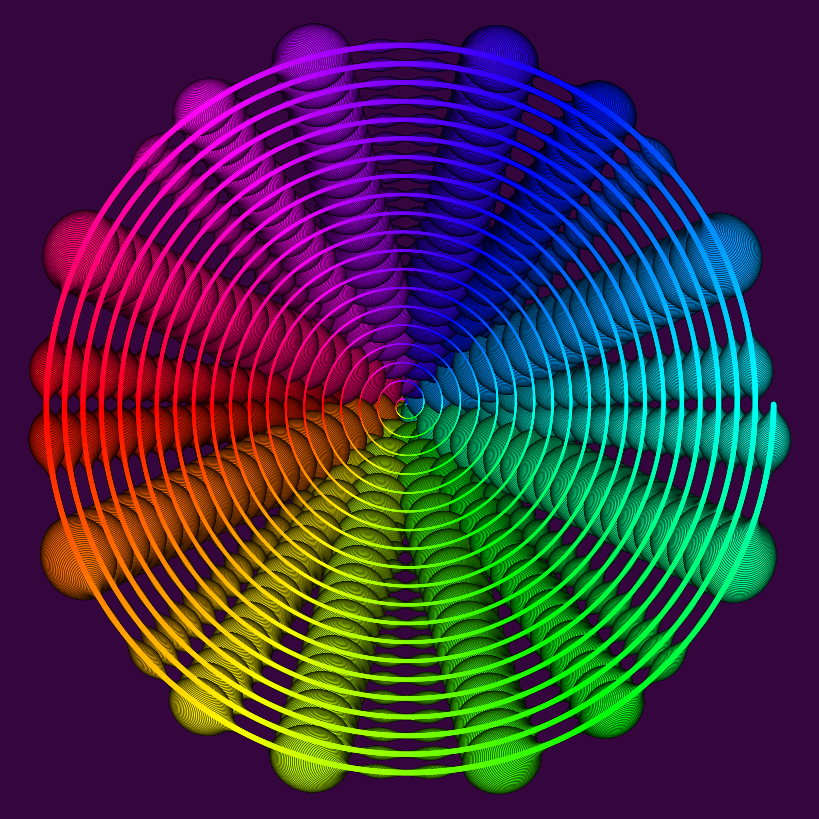

In [ ]:
# --- Drop-in color upgrades for your script ---
# Pick ONE PALETTE block and paste above your plotting section.
# Then replace cmap=... usages with cmap=cmap_line / cmap_scatter as shown.

import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
import numpy as np

def cyclic_cmap(hex_colors, name="custom_cyclic"):
    """Build a smooth cyclic colormap that returns to the start color."""
    # ensure first == last for seamless wrap
    if hex_colors[0].lower() != hex_colors[-1].lower():
        hex_colors = hex_colors + [hex_colors[0]]
    return LinearSegmentedColormap.from_list(name, hex_colors)

# -----------------------------------------------
# PALETTE A — “Twilight Orbit” (perceptual, cyclic, elegant)
# -----------------------------------------------
#bg_fig = "#0b1020"     # deep navy
#bg_ax  = "#06133d"
#edge   = "#eaeef8"
#cmap_line    = mpl.cm.twilight_shifted
#cmap_scatter = mpl.cm.twilight_shifted

# -----------------------------------------------
# PALETTE B — “Aurora Spiral” (cool → warm → cool, high contrast, cyclic)
# -----------------------------------------------
'''bg_fig = "#06070d"
bg_ax  = "#070a16"
edge   = "#f8f8ff"
cmap_line = cyclic_cmap([
    "#0b1e6b", "#1964b3", "#1fbddd", "#37e6b5",
    "#e1f542", "#f7a21b", "#e93f33", "#a81ac5", "#0b1e6b"
], name="aurora_line")
cmap_scatter = cmap_line'''

# -----------------------------------------------
# PALETTE C — “Neon Noir” (teal–magenta split, crisp on dark)
# -----------------------------------------------
bg_fig = "#050507"
bg_ax  = "#0a0b10"
edge   = "#f5f5f7"
cmap_line = cyclic_cmap([
    "#00d4ff", "#28f0c8", "#c9ff3a",
    "#ffb02e", "#ff3d81", "#b000ff", "#00d4ff"
], name="neon_noir")
cmap_scatter = cmap_line

# -----------------------------------------------
# APPLY these changes in your plotting section:
# -----------------------------------------------
# fig, ax = plt.subplots(figsize=(10,10))
# fig.patch.set_facecolor(bg_fig)
# ax.set_facecolor(bg_ax)
# ax.add_collection(LineCollection(seg,
#     colors=cmap_line(hue[:-1]),
#     lw=np.linspace(0.3, 4, len(t)-1), alpha=1, capstyle='round'))
# ax.scatter(x, y, s=sz**2, c=hue, cmap=cmap_scatter,
#            edgecolor=edge, linewidth=0.6, alpha=1, zorder=1)
# ax.axis('off')
# plt.tight_layout(pad=0)
# plt.savefig('crimson_supernova1.png', dpi=600,
#             facecolor=fig.get_facecolor(), edgecolor='none')




import numpy as np, matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

rng = np.random.default_rng(7)
t = np.linspace(0, 40*np.pi, 40400)
r = np.cumsum(rng.uniform(0.4, 1.7, len(t)))

x = r * np.cos(t) + rng.normal(0, 0.8, len(t))
y = r * np.sin(t) + rng.normal(0, 0.8, len(t))

# Fixed: hue now matches every point
seg = np.stack((
    np.column_stack((x[:-1], y[:-1])),
    np.column_stack((x[1:],  y[1:]))
), axis=1)

hue = (np.arctan2(y, x) + np.pi) / (2*np.pi)          # 4400 values
col = plt.cm.hsv(hue[:-1])

lc = LineCollection(seg, colors=col, lw=np.linspace(0.3, 4, len(t)-1),
                    alpha=1, capstyle='round')

sz = 4 + 50 * (np.sin(11*t)**2 * np.cos(7*t)**2)

fig, ax = plt.subplots(figsize=(8,8))
fig.patch.set_facecolor("#34063D")
ax.set_facecolor("#5C660D")
ax.add_collection(lc)
ax.scatter(x, y, s=sz**2, c=hue, cmap='hsv',
           edgecolor='black', linewidth=0.5, alpha=0.8, zorder=1)
#ax.set_xlim(x.min()-6, x.max()+6)
#ax.set_ylim(y.min()-6, y.max()+6)
ax.axis('off')
plt.tight_layout(pad=0)
plt.savefig('crimson_supernova1.png', dpi=600,
            facecolor='white', edgecolor='none')
plt.show()

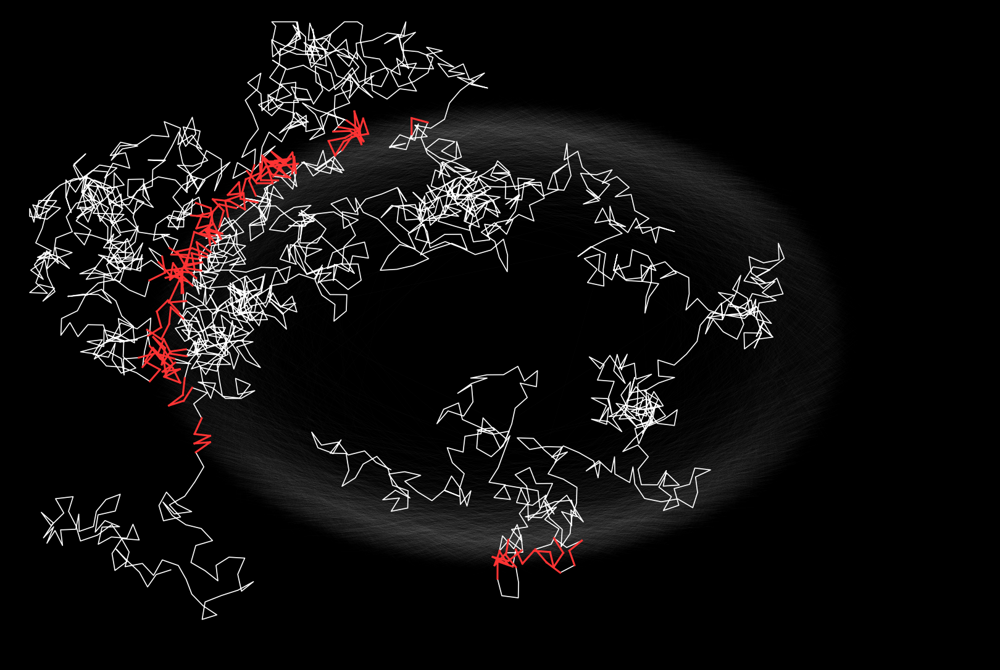

In [ ]:

import numpy as np
import matplotlib.pyplot as plt

rng = np.random.default_rng(2025)

# Canvas
W, H = 1600, 1066   # similar aspect ratio to the reference
fig = plt.figure(figsize=(W/100, H/100), dpi=100)
ax = plt.gca()
ax.set_facecolor("black")
fig.patch.set_facecolor("black")

# Coordinate system: center at (0,0), fit nicely in frame
ax.set_xlim(-1.05, 1.05)
ax.set_ylim(-H/W*1.05, H/W*1.05)
ax.set_xticks([]); ax.set_yticks([])

# --- Ring weave ---
# Base circle radius and subtle jitter
R = 0.72
M = 90000  # number of chords; large for a woven halo
# points on a slightly noisy circle
theta1 = rng.uniform(0, 2*np.pi, M)
theta2 = (theta1 + rng.normal(0, 0.6, M)) % (2*np.pi)  # biased to near-opposite for ring interior texture
r1 = R * (1 + 0.02*rng.standard_normal(M))
r2 = R * (1 + 0.02*rng.standard_normal(M))

x1 = r1 * np.cos(theta1); y1 = r1 * np.sin(theta1) * (H/W)
x2 = r2 * np.cos(theta2); y2 = r2 * np.sin(theta2) * (H/W)

# Draw chords with very low alpha; brightness increases for near-tangential chords to emphasize the rim
# Use linewidth variation to reduce banding
for i in range(M):
    dx = x2[i]-x1[i]; dy = y2[i]-y1[i]
    chord_len = np.hypot(dx, dy)
    # weight rises toward outer rim
    w = 0.12 + 0.75 * (1 - np.exp(-((chord_len/(2*R))**2)*1.8))
    lw = 0.15 + 0.35 * w
    ax.plot([x1[i], x2[i]], [y1[i], y2[i]], color=(1,1,1,w*0.06), linewidth=lw, solid_capstyle='round')

# soft radial vignette for the hollow center
# we'll render a few semi-transparent concentric circles
rings = 250
for k in range(rings):
    rr = R * (k / rings)
    alpha = 0.002 * (1 - np.exp(-8*(k/rings)))
    th = np.linspace(0, 2*np.pi, 400)
    ax.plot(rr*np.cos(th), rr*np.sin(th)*(H/W), color=(1,1,1,alpha), linewidth=0.6)

# --- Wandering path ---
# A self-avoiding-ish random walk with gentle bias toward the center
steps = 2000
step_scale = 0.035
path = np.zeros((steps, 2))
# start near lower-left
path[0] = np.array([-0.7, -0.75*(H/W)])

for i in range(1, steps):
    x, y = path[i-1]
    # bias vector toward center and toward upward motion
    bias = np.array([0.18*(-x), 0.20*(0 - y) + 0.04])
    step = rng.normal(0, 1, 2)
    step = step / (np.linalg.norm(step) + 1e-9)
    step = step*step_scale + bias*0.015
    nxt = path[i-1] + step
    # keep inside bounds
    nxt[0] = np.clip(nxt[0], -1.0, 1.0)
    nxt[1] = np.clip(nxt[1], -H/W, H/W)
    path[i] = nxt

# Identify edges that cross the ring to accent in red
def inside_ring(p, r=R, tol=0.02):
    x,y = p
    rr = np.sqrt(x*x + (y/(H/W))**2)
    return (r - tol) <= rr <= (r + tol)

segments = list(zip(path[:-1], path[1:]))
highlight = [i for i,(a,b) in enumerate(segments) if inside_ring(a) or inside_ring(b)]

# Draw main path
ax.plot(path[:,0], path[:,1], color="white", linewidth=1.2)
# Draw small red accents at ring crossings
for i in highlight:
    a,b = segments[i]
    ax.plot([a[0], b[0]], [a[1], b[1]], color=(1,0.2,0.2,1.0), linewidth=2.2)

# Save
#png_path = "quantum_threads.png"
#svg_path = "quantum_threads.svg"
plt.tight_layout(pad=0)
#plt.savefig(png_path, facecolor=fig.get_facecolor(), bbox_inches="tight", dpi=200)
#plt.savefig(svg_path, facecolor=fig.get_facecolor(), bbox_inches="tight")

plt.show()


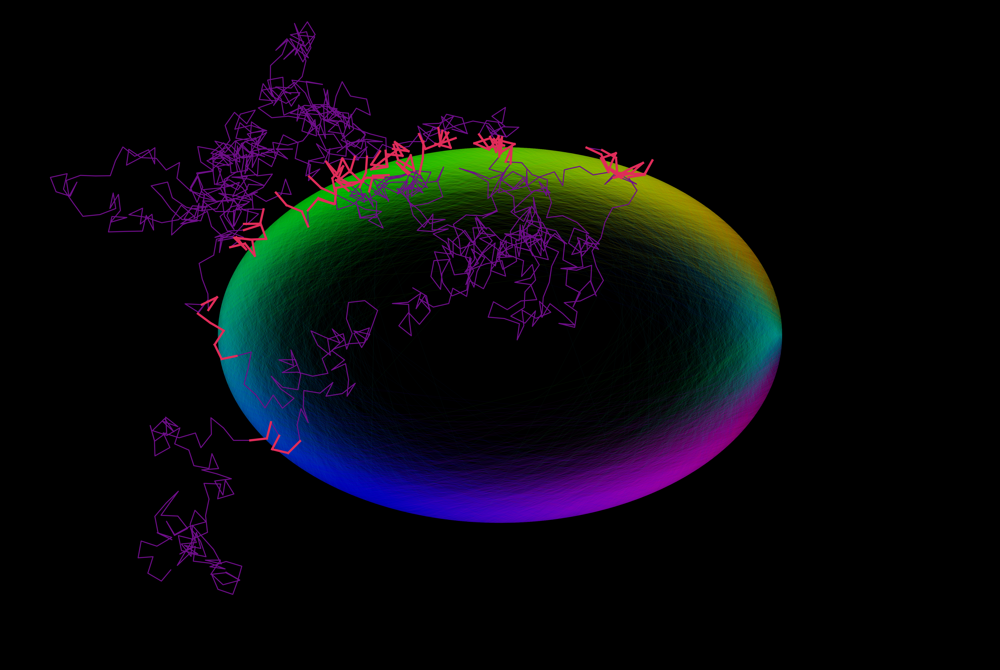

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.path import Path
from matplotlib.patches import PathPatch, Rectangle

# RNG
rng = np.random.default_rng(2025)

# -----------------------------
# Canvas
# -----------------------------
W, H = 1600, 1066
fig, ax = plt.subplots(figsize=(16, 10.66), dpi=300)
ax.set_xlim(-1.05, 1.05)
ax.set_ylim(-1.05 * H / W, 1.05 * H / W)
ax.set_xticks([]); ax.set_yticks([])

# Solid black figure/axes (no transparency)
ax.set_facecolor('black')
fig.patch.set_facecolor('black')
ax.patch.set_alpha(1.0)
fig.patch.set_alpha(1.0)

# -----------------------------
# Ring clip path (ellipse in data coords)
# -----------------------------
R = 0.6
th_clip = np.linspace(0, 2*np.pi, 2048)
rx, ry = R, R * (H / W)
ring_xy = np.c_[rx * np.cos(th_clip), ry * np.sin(th_clip)]

codes = [Path.MOVETO] + [Path.LINETO] * (len(ring_xy) - 1) + [Path.CLOSEPOLY]
verts = np.vstack([ring_xy, ring_xy[0]])
clip_path = Path(verts, codes)
clip_patch = PathPatch(clip_path, transform=ax.transData, facecolor='none')
ax.add_patch(clip_patch)

# -----------------------------
# Rainbow ring weave (draw in chunks)
# -----------------------------
M = 150_000
theta1 = rng.uniform(0, 2*np.pi, M)
theta2 = (theta1 + rng.normal(0, 0.6, M)) % (2*np.pi)
r1 = R * (1 + 0.02 * rng.standard_normal(M))
r2 = R * (1 + 0.02 * rng.standard_normal(M))

x1 = r1 * np.cos(theta1); y1 = r1 * np.sin(theta1) * (H / W)
x2 = r2 * np.cos(theta2); y2 = r2 * np.sin(theta2) * (H / W)

hue = ((theta1 + theta2) / 2) % (2*np.pi) / (2*np.pi)
cmap = plt.cm.hsv

chord_lines = []  # keep references to set clip

chunksz = 5000
for s in range(0, M, chunksz):
    e = min(s + chunksz, M)
    dx = x2[s:e] - x1[s:e]
    dy = y2[s:e] - y1[s:e]
    chord_len = np.hypot(dx, dy)
    w = 0.12 + 0.75 * (1 - np.exp(-((chord_len / (2 * R))**2) * 1.8))
    lw = 0.15 + 0.35 * w
    cols = cmap(hue[s:e])
    for i in range(e - s):
        ln, = ax.plot([x1[s+i], x2[s+i]], [y1[s+i], y2[s+i]],
                      color=cols[i], alpha=w[i] * 0.12,  # darker than 0.2
                      linewidth=lw[i], solid_capstyle='round', zorder=2)
        chord_lines.append(ln)

# Clip all chords to the ring
for ln in chord_lines:
    ln.set_clip_path(clip_patch)

# -----------------------------
# Rainbow vignette (reduced opacity)
# -----------------------------
vignette_lines = []
for k in range(180):  # fewer rings than 300
    rr = R * (k / 180)
    alpha = 0.0009 * (1 - np.exp(-9 * (k / 180)))  # half previous strength
    th = np.linspace(0, 2*np.pi, 600)
    col = cmap(k / 180)
    ln, = ax.plot(rr * np.cos(th), rr * np.sin(th) * (H / W),
                  color=col, alpha=alpha, linewidth=0.5, zorder=1)
    vignette_lines.append(ln)

# Clip vignette to the ring too
for ln in vignette_lines:
    ln.set_clip_path(clip_patch)

# -----------------------------
# Wandering path
# -----------------------------
steps = 1200
path = np.zeros((steps, 2))
path[0] = [-0.7, -0.75 * (H / W)]

for i in range(1, steps):
    bias = np.array([0.18 * (-path[i-1, 0]), 0.20 * (-path[i-1, 1]) + 0.045])
    step = rng.normal(0, 1, 2)
    step /= np.linalg.norm(step) + 1e-9
    step = step * 0.034 + bias * 0.015
    nxt = path[i-1] + step
    nxt[0] = np.clip(nxt[0], -1.0, 1.0)
    nxt[1] = np.clip(nxt[1], -H / W, H / W)
    path[i] = nxt

def inside(p, r=R, tol=0.025):
    return (r - tol) <= np.sqrt(p[0]**2 + (p[1] / (H / W))**2) <= (r + tol)

segs = list(zip(path[:-1], path[1:]))
red_idx = [i for i, (a, b) in enumerate(segs) if inside(a) or inside(b)]

# Main path (not clipped so it can cross the ring)
ax.plot(path[:, 0], path[:, 1], color="#7e119c", lw=1.2, zorder=3)
for i in red_idx:
    a, b = segs[i]
    ax.plot([a[0], b[0]], [a[1], b[1]], color='#ff3366', lw=2.6, zorder=4)

# -----------------------------
# Gentle black veil to keep mids dark
# -----------------------------
x0, x1 = ax.get_xlim()
y0, y1 = ax.get_ylim()
ax.add_patch(Rectangle((x0, y0), x1 - x0, y1 - y0,
                       facecolor='black', alpha=0.12, zorder=10))

# -----------------------------
# Save
# -----------------------------
plt.tight_layout(pad=0)
plt.savefig('quantum_threads_rainbow.png', dpi=600,
            bbox_inches='tight', facecolor=fig.get_facecolor())
plt.savefig('quantum_threads_rainbow.svg',
            bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()


In [ ]:
# Animate “quantum_threads_rainbow” as an MP4
# Strategy:
# 1) Pre-render the heavy rainbow ring weave + vignette once as a static background image.
# 2) Animate only the wandering path (purple) and its highlighted segments (red) over that background.
# 3) Save an MP4 using ffmpeg. Install ffmpeg if needed.

import numpy as np
import matplotlib
matplotlib.use("Agg")  # safe for headless writing
import matplotlib.pyplot as plt
from matplotlib.animation import FFMpegWriter, FuncAnimation

# ----------------------------
# Parameters
# ----------------------------
rng = np.random.default_rng(2025)

# Canvas (match your original aspect)
W, H = 1600, 1066
XMIN, XMAX = -1.05, 1.05
YMIN, YMAX = -1.05*H/W, 1.05*H/W

# Ring + chords
R = 0.6
M = 150_000

# Wandering path
STEPS = 1200

# Output video
FPS = 30
DURATION_SEC = 12
FRAMES = FPS * DURATION_SEC
OUT_MP4 = "quantum_threads_rainbow_anim.mp4"

# Background render resolution (for crispness)
BG_DPI = 300
FIGSIZE = (16, 10.66)  # (W/100, H/100)

# ----------------------------
# Build static background (rainbow ring weave + vignette)
# ----------------------------
fig_bg, ax_bg = plt.subplots(figsize=FIGSIZE, dpi=BG_DPI, facecolor="black")
ax_bg.set_xlim(XMIN, XMAX)
ax_bg.set_ylim(YMIN, YMAX)
ax_bg.set_xticks([]); ax_bg.set_yticks([])
ax_bg.set_facecolor("black")

# Rainbow ring weave (static, expensive—do once)
theta1 = rng.uniform(0, 2*np.pi, M)
theta2 = (theta1 + rng.normal(0, 0.6, M)) % (2*np.pi)
r1 = R * (1 + 0.02*rng.standard_normal(M))
r2 = R * (1 + 0.02*rng.standard_normal(M))

x1 = r1 * np.cos(theta1); y1 = r1 * np.sin(theta1) * (H/W)
x2 = r2 * np.cos(theta2); y2 = r2 * np.sin(theta2) * (H/W)

hue = ((theta1 + theta2) / 2) % (2*np.pi) / (2*np.pi)
cmap = plt.cm.hsv

# Vectorized draw in chunks to keep memory reasonable
chunksz = 5000
for s in range(0, M, chunksz):
    e = min(s + chunksz, M)
    dx = x2[s:e] - x1[s:e]
    dy = y2[s:e] - y1[s:e]
    chord_len = np.hypot(dx, dy)
    w = 0.12 + 0.75 * (1 - np.exp(-((chord_len/(2*R))**2) * 1.8))
    lw = 0.15 + 0.35 * w
    cols = cmap(hue[s:e])
    for i in range(e - s):
        ax_bg.plot([x1[s+i], x2[s+i]], [y1[s+i], y2[s+i]],
                   color=cols[i], alpha=w[i]*0.2, linewidth=lw[i],
                   solid_capstyle='round')

# Rainbow vignette rings
for k in range(300):
    rr = R * (k / 300)
    alpha = 0.0018 * (1 - np.exp(-9*(k/300)))
    th = np.linspace(0, 2*np.pi, 500)
    col = cmap(k/300)
    ax_bg.plot(rr*np.cos(th), rr*np.sin(th)*(H/W),
               color=col, alpha=alpha, linewidth=0.5)

# Save background to an image buffer
fig_bg.tight_layout(pad=0)
BG_PATH = "quantum_threads_rainbow_bg.png"
fig_bg.savefig(BG_PATH, dpi=BG_DPI, facecolor="black", bbox_inches="tight")
plt.close(fig_bg)

# ----------------------------
# Precompute the wandering path and which segments get highlighted
# ----------------------------
path = np.zeros((STEPS, 2))
path[0] = [-0.7, -0.75*(H/W)]

for i in range(1, STEPS):
    bias = np.array([0.18*(-path[i-1,0]), 0.20*(-path[i-1,1]) + 0.045])
    step = rng.normal(0, 1, 2)
    step /= np.linalg.norm(step) + 1e-9
    step = step * 0.034 + bias * 0.015
    nxt = path[i-1] + step
    nxt[0] = np.clip(nxt[0], XMIN+0.05, XMAX-0.05)
    nxt[1] = np.clip(nxt[1], YMIN+0.05, YMAX-0.05)
    path[i] = nxt

def inside(p, r=R, tol=0.025):
    return (r - tol) <= np.sqrt(p[0]**2 + (p[1]/(H/W))**2) <= (r + tol)

segs = list(zip(path[:-1], path[1:]))
red_idx = np.array([i for i,(a,b) in enumerate(segs) if inside(a) or inside(b)], dtype=int)

# ----------------------------
# Animation figure (uses pre-rendered background as an image)
# ----------------------------
plt.rcParams['savefig.facecolor'] = 'black'
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=BG_DPI, facecolor="black")
ax.set_xlim(XMIN, XMAX)
ax.set_ylim(YMIN, YMAX)
ax.set_xticks([]); ax.set_yticks([])
ax.set_facecolor("black")

# Show background image covering the same extent
bg_img = plt.imread(BG_PATH)
ax.imshow(bg_img, extent=[XMIN, XMAX, YMIN, YMAX], aspect="auto")

# Artists for animated elements
# Main purple path
(line_path,) = ax.plot([], [], color="#7e119c", lw=1.5, solid_capstyle='round')

# Red highlight path (plot as many small segments by updating data in chunks)
# We'll draw highlights by re-plotting a thicker red line over the corresponding partial path
(red_line,) = ax.plot([], [], color="#ff3366", lw=2.6, solid_capstyle='round')

# Optional: golden inner spiral trace (fades in slowly)
(gold_line,) = ax.plot([], [], color=(1.0, 0.78, 0.05, 0.0), lw=2.4, solid_capstyle='round')

# Build a smooth inner spiral to reveal over time (matches your static inner line idea)
phi = (1 + np.sqrt(5)) / 2
b = np.log(phi) * 0.88
theta_max = 16*np.pi
th_inner = np.linspace(0, theta_max*0.36, 24000)
r_inner = np.exp(b*th_inner)
rmax = np.exp(b*theta_max)
xg = (r_inner / rmax) * np.cos(th_inner)
yg = (r_inner / rmax) * np.sin(th_inner) * (H/W)

# Map animation frame -> how many points of path are revealed
def idx_for_frame(f):
    # smooth ease-in/out for nicer pacing
    t = f / (FRAMES - 1)
    t_ease = 0.5 - 0.5 * np.cos(np.pi * t)
    return max(2, int(1 + t_ease * (STEPS - 1)))

# Build red highlight coordinates up to k
def red_coords_upto(k):
    # collect red segments among the first k segments
    valid = red_idx[red_idx < k]
    if valid.size == 0:
        return np.empty(0), np.empty(0)
    # stitch them as one polyline with NaN breaks
    xs, ys = [], []
    for i in valid:
        a, b = segs[i]
        xs += [a[0], b[0], np.nan]
        ys += [a[1], b[1], np.nan]
    return np.array(xs), np.array(ys)

# Gold inner spiral reveal scheduling
def gold_alpha_for_frame(f):
    # fade in between 20% and 80% of the animation
    t = f / (FRAMES - 1)
    if t < 0.20 or t > 0.80:
        return 0.0
    # smooth ramp up then down
    u = (t - 0.20) / 0.60
    a = np.sin(np.pi * u)  # 0→1→0
    return 0.40 * a  # max alpha 0.4

def gold_idx_for_frame(f):
    t = f / (FRAMES - 1)
    t_ease = 0.5 - 0.5 * np.cos(np.pi * t)
    return max(2, int(t_ease * (len(xg) - 1)))

# Init and update
def init():
    line_path.set_data([], [])
    red_line.set_data([], [])
    gold_line.set_data([], [])
    return line_path, red_line, gold_line

def update(f):
    k = idx_for_frame(f)
    # main path
    line_path.set_data(path[:k,0], path[:k,1])

    # red highlights up to k
    rx, ry = red_coords_upto(k-1)
    red_line.set_data(rx, ry)

    # gold spiral
    gk = gold_idx_for_frame(f)
    ga = gold_alpha_for_frame(f)
    gold_line.set_data(xg[:gk], yg[:gk])
    gold_line.set_color((1.0, 0.78, 0.05, ga))

    return line_path, red_line, gold_line

anim = FuncAnimation(fig, update, init_func=init,
                     frames=FRAMES, interval=1000/FPS, blit=True)

# Write video (requires ffmpeg installed)
#writer = FFMpegWriter(fps=FPS, bitrate=16_000, codec="libx264")
#anim.save(OUT_MP4, writer=writer, dpi=BG_DPI, savefig_kwargs={"facecolor":"black", "bbox_inches":"tight"})
#print("Saved:", OUT_MP4)


FileNotFoundError: [Errno 2] No such file or directory: 'ffmpeg'

In [7]:
import numpy as np
import matplotlib.pyplot as plt

rng = np.random.default_rng(11)

def kron_n(ops):
    out = ops[0]
    for op in ops[1:]:
        out = np.kron(out, op)
    return out

I2 = np.eye(2, dtype=np.complex128)
H = (1/np.sqrt(2))*np.array([[1,1],[1,-1]], dtype=np.complex128)
def Rx(theta):
    c = np.cos(theta/2); s = -1j*np.sin(theta/2)
    return np.array([[c, s],[s, c]], dtype=np.complex128)
def Rz(phi):
    return np.array([[np.exp(-1j*phi/2),0],[0,np.exp(1j*phi/2)]], dtype=np.complex128)
CZ = np.diag([1,1,1,-1]).astype(np.complex128)

def apply_1q(U, psi, n, q):
    ops = [I2]*n; ops[q] = U
    Ufull = kron_n(ops)
    return Ufull @ psi

def apply_2q(U, psi, n, q1, q2):
    if q1 == q2: 
        return psi
    if q1 > q2:
        q1, q2 = q2, q1
    dim = 2**n
    out = np.zeros(dim, dtype=np.complex128)
    mask1 = 1 << (n-1-q1); mask2 = 1 << (n-1-q2)
    for idx in range(dim):
        b1 = 1 if (idx & mask1) else 0
        b2 = 1 if (idx & mask2) else 0
        two_idx = (b1<<1) | b2
        amp = 0j
        for tb in range(4):
            c1 = (tb>>1)&1; c2 = tb & 1
            src = idx
            if c1 != b1: src = (src | mask1) if c1==1 else (src & ~mask1)
            if c2 != b2: src = (src | mask2) if c2==1 else (src & ~mask2)
            amp += U[two_idx, tb] * psi[src]
        out[idx] = amp
    return out

n = 10; dim = 2**n
psi = np.zeros(dim, dtype=np.complex128); psi[0] = 1.0

# Hadamards
for q in range(n):
    psi = apply_1q(H, psi, n, q)
# Entangle in a ladder
for q in range(0, n-1, 2):
    psi = apply_2q(CZ, psi, n, q, q+1)
for q in range(1, n-1, 2):
    psi = apply_2q(CZ, psi, n, q, q+1)
# Local random phases and x-rotations
for q in range(n):
    psi = apply_1q(Rz(rng.uniform(-np.pi, np.pi)), psi, n, q)
for q in range(n):
    psi = apply_1q(Rx(rng.uniform(-1.0, 1.0)), psi, n, q)

psi = psi/np.linalg.norm(psi)

# Measurement distribution with depolarizing + readout noise
p_depol = 0.08
P = (1 - p_depol)*np.abs(psi)**2 + p_depol/dim
P = P/np.sum(P)

r = 0.01  # small bit-flip noise
if r > 0:
    P_noisy = np.zeros_like(P)
    for idx,prob in enumerate(P):
        for mask in range(1<<n):
            flips = bin(mask).count("1")
            weight = (r**flips)*((1-r)**(n-flips))
            P_noisy[idx ^ mask] += prob * weight
    P = P_noisy/np.sum(P_noisy)

# Hilbert mapping for order 5 => 32x32
def hilbert_index_to_xy(n_order, index):
    x = y = 0; t = index; s = 1
    while s < (1 << n_order):
        rx = 1 & (t//2)
        ry = 1 & (t ^ rx)
        if ry == 0:
            if rx == 1:
                x, y = s-1 - x, s-1 - y
            x, y = y, x
        x += s * rx
        y += s * ry
        t //= 4
        s <<= 1
    return x, y

order = 5; N = 1<<order
xs = np.zeros(dim, dtype=int); ys = np.zeros(dim, dtype=int)
for i in range(dim):
    x,y = hilbert_index_to_xy(order, i)
    xs[i] = x; ys[i] = y

grid = np.zeros((N, N), dtype=np.float64)
for i,prob in enumerate(P):
    grid[ys[i], xs[i]] += prob

def gaussian_kernel1d(sigma, radius=3):
    r = int(max(1, radius*sigma))
    x = np.arange(-r, r+1)
    k = np.exp(-(x**2)/(2*sigma*sigma)); k /= k.sum()
    return k

def gaussian_blur(img, sigma):
    k = gaussian_kernel1d(sigma)
    tmp = np.apply_along_axis(lambda m: np.convolve(m, k, mode="same"), 1, img)
    out = np.apply_along_axis(lambda m: np.convolve(m, k, mode="same"), 0, tmp)
    return out

density = gaussian_blur(grid, sigma=1.0)
density = density/np.max(density)

amp_grid = np.zeros((N, N), dtype=np.complex128)
for i,a in enumerate(psi):
    amp_grid[ys[i], xs[i]] = a
phase = np.angle(amp_grid)
phasor = np.exp(1j*phase)
phasor = gaussian_blur(np.real(phasor), 1.0) + 1j*gaussian_blur(np.imag(phasor), 1.0)
phase_smooth = np.angle(phasor)

scale = 16  # 512x512 output
def upsample_nearest(img, s):
    return np.repeat(np.repeat(img, s, axis=0), s, axis=1)

D_hi = upsample_nearest(density, scale)
Phi_hi = upsample_nearest(phase_smooth, scale)

gy, gx = np.gradient(Phi_hi)
norm = np.sqrt(gx*gx + gy*gy) + 1e-9
ux = gx / norm; uy = gy / norm

fig = plt.figure(figsize=(10,8), dpi=600)
ax = plt.gca()
ax.imshow(D_hi, origin="lower", interpolation="bilinear")
ny, nx = D_hi.shape
step = max(1, nx//64)
Xg, Yg = np.meshgrid(np.arange(0, nx, step), np.arange(0, ny, step))
U = ux[::step, ::step]; V = uy[::step, ::step]
ax.streamplot(Xg, Yg, U, V, density=1.2, linewidth=0.5)
ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
png_path = "quantum_hilbert_phase_10q.png"
#svg_path = "quantum_hilbert_phase_10q.svg"
plt.savefig(png_path, bbox_inches="tight")
#plt.savefig(svg_path, bbox_inches="tight")
plt.show()


/tmp/ipykernel_13664/1963932048.py:156: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [ ]:
import numpy as np, matplotlib.pyplot as plt

# ————— One cosmic detonation —————
rng = np.random.default_rng(19)
n = 22_0000
theta = rng.uniform(0, 2*np.pi, n)
phi   = np.arccos(1 - 2*rng.uniform(0,1,n))   # uniform on sphere
r     = rng.gamma(2, 1.4, n)**0.5              # dense core, long tails

x = r * np.sin(phi) * np.cos(theta)
y = r * np.sin(phi) * np.sin(theta)
z = r * np.cos(phi)

# Colour by birth-energy
energy = r**4
norm   = plt.Normalize(energy.min(), energy.max())
cmap   = plt.cm.get_cmap('inferno')

# Canvas of pure white
fig = plt.figure(figsize=(12,12))
fig.patch.set_facecolor('white')
ax = fig.add_subplot(111)
ax.set_facecolor('white')
ax.axis('off')

# Exploding needles
for i in range(n):
    col = cmap(norm(energy[i]))
    ax.plot([0, x[i]], [0, y[i]], color=col,
            lw=0.7, alpha=0.85, solid_capstyle='round')

# Glowing heart
ax.scatter(0,0, s=1800, c='grey', edgecolor="#77430E",
           linewidth=1, zorder=3, alpha=1)
ax.scatter(0,0, s=600,  c="#812810f4", zorder=4)

#plt.xlim(-28, 28); plt.ylim(-28, 28)
plt.tight_layout(pad=0)
plt.savefig('crimson_supernova.png', dpi=600,
            facecolor='white', edgecolor='none')
plt.show()

In [ ]:
# Quick versions for the remaining two pieces with lighter chord counts to ensure fast rendering.
import numpy as np
import matplotlib.pyplot as plt

def save_show(fig, base):
    png = f"{base}.png"
    svg = f"{base}.svg"
    plt.tight_layout(pad=0)
    fig.savefig(png, facecolor=fig.get_facecolor(), bbox_inches="tight", dpi=200)
    fig.savefig(svg, facecolor=fig.get_facecolor(), bbox_inches="tight")
    plt.show()
    print(png)
    print(svg)

def setup_canvas(W=1600, H=1066):
    fig = plt.figure(figsize=(W/100, H/100), dpi=100)
    ax = plt.gca()
    ax.set_facecolor("black"); fig.patch.set_facecolor("black")
    aspect = H/W
    ax.set_xlim(-1.05, 1.05); ax.set_ylim(-aspect*1.05, aspect*1.05)
    ax.set_xticks([]); ax.set_yticks([])
    return fig, ax, aspect

def ring_chords(ax, cx, cy, R, M, aspect, rng, spiral=0.0, jitter=0.02, alpha_scale=0.10):
    th1 = rng.uniform(0, 2*np.pi, M)
    th2 = (th1 + rng.normal(0.0, 0.7, M) + spiral*np.sin(th1*2.0)) % (2*np.pi)
    r1 = R*(1 + jitter*rng.standard_normal(M))
    r2 = R*(1 + jitter*rng.standard_normal(M))
    x1 = cx + r1*np.cos(th1); y1 = cy + r1*np.sin(th1)*aspect
    x2 = cx + r2*np.cos(th2); y2 = cy + r2*np.sin(th2)*aspect
    for i in range(M):
        dx = x2[i]-x1[i]; dy = y2[i]-y1[i]
        L = np.hypot(dx, dy)
        w = 0.15 + 0.85*(1 - np.exp(-((L/(2*R))**2)*1.8))
        lw = 0.10 + 0.45*w
        ax.plot([x1[i], x2[i]], [y1[i], y2[i]], color=(1,1,1,w*alpha_scale), linewidth=lw, solid_capstyle='round')

def ring_cross_indices(path, cx, cy, R, aspect, tol):
    def near(p):
        x,y = p; xx = x-cx; yy = (y-cy)/aspect
        r = np.hypot(xx, yy)
        return (R-tol) <= r <= (R+tol)
    segs = list(zip(path[:-1], path[1:]))
    idx = [i for i,(a,b) in enumerate(segs) if near(a) or near(b)]
    return idx, segs

def random_walk(start, steps, scale, bias_fn, bounds, rng):
    path = np.zeros((steps,2)); path[0] = start
    for i in range(1, steps):
        x,y = path[i-1]
        noise = rng.normal(0,1,2); noise = noise/(np.linalg.norm(noise)+1e-9)
        step = noise*scale + bias_fn(np.array([x,y]))
        nxt = path[i-1] + step
        nxt[0] = np.clip(nxt[0], bounds[0], bounds[1])
        nxt[1] = np.clip(nxt[1], bounds[2], bounds[3])
        path[i] = nxt
    return path

# Fast twin_resonators
def twin_resonators_fast(seed=222):
    rng = np.random.default_rng(seed)
    fig, ax, aspect = setup_canvas()
    params = [(0.18, 0.02, 0.58, 9000, 0.5),
              (0.58, -0.02, 0.52, 8000, -0.6)]
    for cx, cy, R, M, spr in params:
        ring_chords(ax, cx, cy, R, M=M, aspect=aspect, rng=rng, spiral=spr, jitter=0.02, alpha_scale=0.14)
        th = np.linspace(0, 2*np.pi, 360)
        for k in range(140):
            rr = R*(k/140)
            ax.plot(cx + rr*np.cos(th), cy + rr*np.sin(th)*aspect, color=(0,0,0,0.035), linewidth=4.0)
    start = np.array([-0.95, -0.85*aspect])
    def bias(p):
        target = np.array([0.38, 0.0])
        v = target - p; v = v/(np.linalg.norm(v)+1e-9)
        return 0.020*v + np.array([0, 0.004])
    path = random_walk(start, steps=1400, scale=0.030, bias_fn=bias, bounds=(-1,1,-aspect,aspect), rng=rng)
    ax.plot(path[:,0], path[:,1], color="white", linewidth=1.7)
    for cx, cy, R, _, _ in params:
        idx, segs = ring_cross_indices(path, cx, cy, R, aspect, tol=0.035)
        for i in idx:
            a,b = segs[i]; ax.plot([a[0],b[0]],[a[1],b[1]], color=(1,0.25,0.25,1.0), linewidth=2.1)
    save_show(fig, "twin_resonators_fast")

# Fast braided_bridge
def braided_bridge_fast(seed=333):
    rng = np.random.default_rng(seed)
    fig, ax, aspect = setup_canvas()
    L = 12000
    cx1, cy1, R1 = -0.15, 0.03, 0.54
    cx2, cy2, R2 = 0.55, -0.01, 0.56
    th1 = rng.uniform(0, 2*np.pi, L)
    th2 = (th1 + rng.normal(0, 0.8, L)) % (2*np.pi)
    r1 = R1*(1 + 0.02*rng.standard_normal(L))
    r2 = R2*(1 + 0.02*rng.standard_normal(L))
    x1 = cx1 + r1*np.cos(th1); y1 = cy1 + r1*np.sin(th1)*aspect
    x2 = cx2 + r2*np.cos(th2); y2 = cy2 + r2*np.sin(th2)*aspect
    for i in range(L):
        midx = 0.5*(x1[i]+x2[i]); midy = 0.5*(y1[i]+y2[i])
        w = 0.12 + 0.88*np.exp(-((midx-0.22)**2 + (midy-0.00)**2)/0.08)
        ax.plot([x1[i],x2[i]],[y1[i],y2[i]], color=(1,1,1,w*0.08), linewidth=0.2 + 0.55*w, solid_capstyle='round')
    th = np.linspace(0, 2*np.pi, 360)
    for (cx,cy,R) in [(cx1,cy1,R1),(cx2,cy2,R2)]:
        for k in range(140):
            rr = R*(k/140)
            ax.plot(cx + rr*np.cos(th), cy + rr*np.sin(th)*aspect, color=(0,0,0,0.035), linewidth=4.0)
    start = np.array([-0.95, -0.70*aspect])
    def bias(p):
        t1 = np.array([cx1, cy1]); t2 = np.array([0.20, 0.04]); t3 = np.array([cx2, cy2])
        d1 = np.linalg.norm(t1-p); d2 = np.linalg.norm(t2-p); d3 = np.linalg.norm(t3-p)
        tgt = t1 if d1<d2 and d1<d3 else (t2 if d2<d3 else t3)
        v = tgt - p; v = v/(np.linalg.norm(v)+1e-9)
        return 0.018*v + np.array([0, 0.004])
    path = random_walk(start, steps=1400, scale=0.028, bias_fn=bias, bounds=(-1,1,-aspect,aspect), rng=rng)
    ax.plot(path[:,0], path[:,1], color="white", linewidth=1.7)
    for (cx,cy,R) in [(cx1,cy1,R1),(cx2,cy2,R2)]:
        idx, segs = ring_cross_indices(path, cx, cy, R, aspect, tol=0.035)
        for i in idx:
            a,b = segs[i]; ax.plot([a[0],b[0]],[a[1],b[1]], color=(1,0.2,0.25,1.0), linewidth=2.1)
    save_show(fig, "braided_bridge_fast")

twin_resonators_fast()
braided_bridge_fast()


In [ ]:


import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

rng = np.random.default_rng(2025)

# --- Figure: 10x8 inches ---
DPI =600
FIGSIZE = (10, 8)
fig = plt.figure(figsize=FIGSIZE, dpi=DPI)
ax = plt.gca()
bg = (1.0, 0.995, 0.965)
ax.set_facecolor(bg); fig.patch.set_facecolor(bg)
ax.set_axis_off()

# Convert normalized canvas coords to pixel-like coords based on actual figure size
W, H = fig.get_figwidth() * DPI, fig.get_figheight() * DPI
cx, cy = 0.56, 0.54   # center in 0..1 figure coords
scale = 0.50          # overall scale

def to_canvas(xn, yn):
    x = (cx + scale*xn) * W
    y = (cy + scale*yn * (W/H)) * H
    return np.stack([x, y], axis=-1)

# --- Palette ---
def lerp(a, b, t): return a*(1-t) + b*t
def grad_warm(t):
    c1 = np.array([0.98, 0.50, 0.18])
    c2 = np.array([1.00, 0.75, 0.20])
    c3 = np.array([1.00, 0.90, 0.40])
    if t < 0.6:
        u = t/0.6; return lerp(c1, c2, u)
    else:
        u = (t-0.6)/0.4; return lerp(c2, c3, u)
blue = np.array([0.08, 0.15, 0.65])
red  = np.array([0.85, 0.12, 0.10])

# --- Spiral geometry r = a*exp(b*theta) ---
phi = (1 + np.sqrt(5)) / 2
b = np.log(phi) * 0.88
theta_max = 16*np.pi
N = 3200

def spiral_points(N, theta_max, b, a=1.0):
    th = np.linspace(0, theta_max, N)
    r = a*np.exp(b*th)
    return r*np.cos(th), r*np.sin(th), th, r

x, y, th, r = spiral_points(N, theta_max, b, a=1e-4)
rmax = r.max(); x /= rmax; y /= rmax

# --- Curl-like flow field for curvature ---
def smooth_field(X, Y):
    kx = np.array([1.1, 1.6, 0.9]); ky = np.array([1.3, 0.8, 1.7])
    phx = np.array([0.2, 2.3, 4.1]); phy = np.array([1.1, 3.4, 5.7])
    s = 0
    for i in range(3):
        s += np.sin(kx[i]*X + ky[i]*Y + phx[i]) + np.cos(ky[i]*X - kx[i]*Y + phy[i])
    return s/6.0

def curl_noise(p):
    x, y = p[...,0], p[...,1]
    eps = 0.006
    fx1 = smooth_field(3*(x+eps), 3*y); fx0 = smooth_field(3*(x-eps), 3*y)
    fy1 = smooth_field(3*x, 3*(y+eps)); fy0 = smooth_field(3*x, 3*(y-eps))
    dfdx = (fx1 - fx0)/(2*eps); dfdy = (fy1 - fy0)/(2*eps)
    u = np.stack([dfdy, -dfdx], axis=-1)
    n = np.linalg.norm(u, axis=-1, keepdims=True) + 1e-9
    return u / n

# --- Curved chords via quadratic Béziers ---
skip = 27
M = N - skip
P1 = np.stack([x[:M], y[:M]], axis=1)
P2 = np.stack([x[skip:], y[skip:]], axis=1)
mid = (P1 + P2) / 2
ctrl = mid*0.86 + 0.16*curl_noise(mid)

def bezier_quad(p0, p1, p2, t):
    t = t[:, None]
    return (1-t)**2*p0 + 2*(1-t)*t*p1 + t**2*p2

samples = 10
ts = np.linspace(0, 1, samples)

curves, cols = [], []
for i in range(0, M, 2):
    pts = bezier_quad(P1[i], ctrl[i], P2[i], ts)
    pts += rng.normal(0, 0.0007, pts.shape)
    curves.append(to_canvas(pts[:,0], pts[:,1]))
    tcol = i/M
    cols.append(np.append(grad_warm(tcol), 0.07 + 0.05*np.cos(6*tcol)))

seg_list, col_list = [], []
for pts, c in zip(curves, cols):
    seg_list.extend(np.stack([pts[:-1], pts[1:]], axis=1))
    col_list.extend([c]*(len(pts)-1))
segments = np.array(seg_list); colors = np.array(col_list)

# --- Bent tangent ribbons ---
T = 1000
rib_segments, rib_colors = [], []
tan_angle = np.arctan(1/b)
for _ in range(T):
    k = rng.integers(80, N-80)
    px, py = x[k], y[k]
    ang = np.arctan2(py, px) + tan_angle + rng.normal(0, 0.05)
    L = rng.uniform(0.9, 1.4)
    tline = np.linspace(-L, L, 38)
    base = np.stack([px + tline*np.cos(ang), py + tline*np.sin(ang)], axis=1)
    base += 0.08*curl_noise(base)
    pts = to_canvas(base[:,0], base[:,1])
    for j in range(len(pts)-1):
        rib_segments.append([pts[j], pts[j+1]])
        rib_colors.append(np.append(grad_warm(0.45 + 0.4*np.sin(ang+0.3)), 0.09))
rib_segments = np.array(rib_segments); rib_colors = np.array(rib_colors)

# --- Accent rings ---
num_orbits = 10
orbit_pts = []
for j in range(num_orbits):
    f = (j+1)/num_orbits
    th0 = 0.42*theta_max*f*0.9
    th1 = th0 + 0.34*theta_max*(1 - f*0.6)
    ths = np.linspace(th0, th1, 220)
    rr = np.exp(b*ths)/rmax*(0.95**(num_orbits-j-1))
    xx = rr*np.cos(ths); yy = rr*np.sin(ths)
    orbit_pts.append(to_canvas(xx, yy))

# --- Render ---
from matplotlib.patches import Rectangle
ax.set_xlim(0, W); ax.set_ylim(0, H)
ax.add_patch(Rectangle((0,0), W, H, facecolor=(0,0,0,0.03), edgecolor='none'))

ax.add_collection(LineCollection(rib_segments, colors=rib_colors, linewidths=0.9,
                                 capstyle='round', joinstyle='round'))
ax.add_collection(LineCollection(segments, colors=colors, linewidths=0.65, capstyle='round'))

xg, yg, _, _ = spiral_points(24000, theta_max*0.36, b, a=1e-4); xg/=rmax; yg/=rmax
inner = to_canvas(xg, yg)
ax.plot(inner[:,0], inner[:,1], color=(1.0, 0.78, 0.05, 0.40), linewidth=2.4)

for ring in orbit_pts:
    sel = rng.random(len(ring)) > 0.5
    ax.scatter(ring[sel,0], ring[sel,1], s=12, marker="*", c=[red], linewidths=0.3, alpha=1)
    ax.scatter(ring[~sel,0], ring[~sel,1], s=12, marker="+", c=[blue], linewidths=0.9, alpha=1)

for k in range(2):
    s = 0.012*(k+1)
    dup = inner + rng.normal(0, 0.5, inner.shape)*s
    ax.plot(dup[:,0], dup[:,1], color=(1.0, 0.76, 0.04, 0.20-0.05*k), linewidth=2.0-0.3*k)

# --- Save ---
png = "golden_spiral_reverie_10x8.png"
svg = "golden_spiral_reverie_10x8.svg"
plt.savefig(png, facecolor=fig.get_facecolor(), bbox_inches="tight", dpi=DPI)
plt.savefig(svg, facecolor=fig.get_facecolor(), bbox_inches="tight")
print(png)
print(svg)


In [ ]:
# Entangled Quantum Circuit → Entangled Particles (left circuit enlarged & unclipped, right viz larger)
# Requires: numpy, matplotlib, qiskit (for the left panel image)

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, Circle, Rectangle
from matplotlib.collections import LineCollection

# Detect Qiskit
USE_QISKIT = True
try:
    from qiskit import QuantumCircuit
    from qiskit.visualization import circuit_drawer
except Exception:
    USE_QISKIT = False

rng = np.random.default_rng(1337)

# ---------------- Canvas & layout ----------------
W, H = 18, 10
DPI = 300
fig = plt.figure(figsize=(W, H), dpi=DPI)
ax = fig.add_subplot(111)
ax.set_aspect('equal')
ax.set_xlim(0, W)
ax.set_ylim(0, H)
ax.set_facecolor("#1a234d")
fig.patch.set_facecolor("#05070c")
ax.axis('off')

# Layout: make the right side bigger
x_margin = 0.8
x_left  = x_margin
x_split = x_left + 8.2             # narrower left panel than before
x_right = W - x_margin
y_bot, y_top = 1.0, H - 1.0

# Colors
col_text   = (0.92, 0.96, 1.00, 0.95)
col_link   = (0.15, 0.85, 0.95, 0.65)
col_particle_a = (0.20, 0.95, 0.80, 0.85)
col_particle_b = (0.98, 0.35, 0.75, 0.85)
col_ring   = (0.95, 0.95, 1.00, 0.14)

# ---------- Helpers ----------
def draw_glow_line(ax, x0, y0, x1, y1, color, base_lw=3.0, layers=4, spread=1.6, z=2):
    for i in range(layers, 0, -1):
        alpha = color[-1] * (i / (layers + 1))
        lw = base_lw + spread * i
        ax.plot([x0, x1], [y0, y1], color=color[:-1] + (alpha,), lw=lw, solid_capstyle='round', zorder=z)

def make_cmap(stops):
    xs = np.linspace(0, 1, len(stops))
    def cmap(t):
        t = np.clip(t, 0, 1)
        ti = np.atleast_1d(t)
        idx = np.minimum(np.searchsorted(xs, ti, side='right'), len(xs)-1)
        t0 = xs[np.maximum(idx-1, 0)]
        t1 = xs[idx]
        c0 = np.array(stops)[np.maximum(idx-1, 0)]
        c1 = np.array(stops)[idx]
        u = np.where(t1>t0, (ti - t0)/(t1 - t0 + 1e-9), 0)
        return c0*(1-u)[:,None] + c1*u[:,None]
    return cmap

# ---------------- Left panel: Qiskit circuit (bigger, not clipped) ----------------
if USE_QISKIT:
    qc = QuantumCircuit(4, 4)
    qc.h(0); qc.cx(0,1)
    qc.ry(np.pi/3, 2); qc.rz(np.pi/5, 3); qc.cx(2,3)
    qc.measure([1,3], [0,1])

    # Larger fonts & drawing scale; dark background
    fig_circ = circuit_drawer(
        qc, output='mpl', fold=-1, scale=1.2,
        style={'backgroundcolor': "#1d2231", 'fontsize': 12}
    )
    fig_circ.canvas.draw()
    w, h = fig_circ.canvas.get_width_height()
    img = np.frombuffer(fig_circ.canvas.tostring_rgb(), dtype=np.uint8).reshape(h, w, 3)
    plt.close(fig_circ)

    # Generous extent so text labels are not cut off
    pad_x = 0.3
    pad_y = 0.25
    extent = [x_left + pad_x, x_split - pad_x, y_bot + pad_y, y_top - pad_y]
    ax.imshow(img, extent=extent, aspect='auto', zorder=4)
else:
    # Minimal fallback stylized box if Qiskit isn't available
    box = FancyBboxPatch((x_left, y_bot), x_split - x_left, y_top - y_bot,
                         boxstyle="round,pad=0.03,rounding_size=0.35",
                         facecolor=(0.24, 0.33, 0.62, 0.6),
                         edgecolor=(1,1,1,0.2), linewidth=2.0, zorder=6)
    ax.add_patch(box)
    ax.text(x_left+0.4, y_top-0.6, "Circuit", fontsize=20, color=col_text, ha='left', va='center')

# Optional subtle “state prep” beam (no title text anywhere)
bx0, bx1 = x_split + 0.15, x_split + 0.9
for k in range(5):
    yb = np.interp(k, [0,4], [y_bot+0.8, y_top-0.8])
    draw_glow_line(ax, bx0, yb, bx1, (y_bot+y_top)/2, col_link, base_lw=1.6, layers=4, spread=0.7, z=4)

# ---------------- Right panel: bigger entangled-pair viz ----------------
# Shift center to the right region and scale up geometry
cx = (x_split + x_right) / 2
right_width = (x_right - x_split)
scale = right_width / 6.4   # tune for size; larger -> bigger shapes

sep = 3.8 * scale
pA = np.array([cx - sep/2, (y_bot+y_top)/2 + 1.2*scale])
pB = np.array([cx + sep/2, (y_bot+y_top)/2 - 1.2*scale])

def soft_halo(ax, center, r, color, layers=7):
    x,y = center
    for i in range(layers, 0, -1):
        alpha = color[-1] * (i / (layers + 1)) * 0.6
        c = color[:-1] + (alpha,)
        ax.add_patch(Circle((x, y), r*(1 + 0.25*i/layers), edgecolor='none', facecolor=c, zorder=3))

soft_halo(ax, pA, 0.85*scale, col_particle_a)
soft_halo(ax, pB, 0.85*scale, col_particle_b)

ax.add_patch(Circle(pA, 0.36*scale, facecolor=col_particle_a, edgecolor=(1,1,1,0.25), linewidth=1.2, zorder=6))
ax.add_patch(Circle(pB, 0.36*scale, facecolor=col_particle_b, edgecolor=(1,1,1,0.25), linewidth=1.2, zorder=6))

# Correlation rings (scaled)
for k in range(26):
    r = (3.0 + 0.065*k) * scale
    col = col_ring[:-1] + (col_ring[-1]*(1 - k/28),)
    circ = Circle(((pA[0]+pB[0])/2, (pA[1]+pB[1])/2), r, fill=False, edgecolor=col, linewidth=0.9, zorder=2)
    ax.add_patch(circ)

# Entanglement filaments (scaled)
def liss_pair(centerA, centerB, amp=1.2, a=4, b=7, n=3400, jitter=0.015):
    t = np.linspace(0, 2*np.pi, n, endpoint=False)
    x = amp*np.sin(a*t)
    y = amp*np.sin(b*t + np.pi/2)
    pts = np.stack([x, y], axis=1)
    rot = np.array([[np.cos(0.35), -np.sin(0.35)],
                    [np.sin(0.35),  np.cos(0.35)]])
    pts = (pts @ rot.T) * scale
    ptsA = pts + rng.normal(0, jitter*scale, pts.shape) + centerA
    ptsB = -pts + rng.normal(0, jitter*scale, pts.shape) + centerB
    return ptsA, ptsB

ptsA, ptsB = liss_pair(pA, pB)

def gradient_lines(ax, P, cmap, alpha=0.28, lw0=1.0, lw1=2.2, z=6):
    segs = np.stack([P[:-1], P[1:]], axis=1)
    t = np.linspace(0, 1, len(P)-1)
    cols = cmap(t)
    cols[:, -1] = alpha*(0.4 + 0.6*(np.sin(5*np.pi*t)**2))
    lws = (lw0 + (lw1 - lw0)*(0.5 + 0.5*np.sin(2*np.pi*t))) * (0.9*scale)
    for i in range(0, len(segs), 120):
        j = min(i+120, len(segs))
        lc = LineCollection(segs[i:j], colors=cols[i:j], linewidths=lws[i:j], capstyle='round', zorder=z)
        ax.add_collection(lc)

cmapA = make_cmap([(0.0,0.9,0.8,0.0), (0.1,1.0,1.0,0.0), (0.7,0.3,1.0,0.0), (0.9,0.2,0.9,0.0)])
cmapB = make_cmap([(1.0,0.2,0.6,0.0), (1.0,0.4,0.6,0.0), (1.0,0.6,0.3,0.0), (1.0,0.8,0.2,0.0)])

gradient_lines(ax, ptsA, cmapA, alpha=0.30, lw0=1.0, lw1=2.4, z=6)
gradient_lines(ax, ptsB, cmapB, alpha=0.30, lw0=1.0, lw1=2.4, z=6)

# Pairing threads (sparser, brighter)
sel = np.linspace(0, len(ptsA)-1, 200, dtype=int)
for i in sel:
    A = ptsA[i]; B = ptsB[i]
    draw_glow_line(ax, A[0], A[1], B[0], B[1], color=(0.75,0.9,1.0,0.24), base_lw=0.7*scale, layers=3, spread=0.6, z=4)
    ax.plot([A[0], B[0]], [A[1], B[1]], color=(0.9,0.95,1,0.12), lw=0.9*scale, zorder=7)

# Sparkles on outer ring
num_sp = 2000
angles = rng.uniform(0, 2*np.pi, num_sp)
rad = (3.0*scale) + rng.normal(0, 0.08*scale, num_sp)
cx0, cy0 = (pA[0] + pB[0])/2, (pA[1] + pB[1])/2
sx = cx0 + rad*np.cos(angles)
sy = cy0 + rad*np.sin(angles)
sizes = rng.uniform(6, 28, num_sp) * (0.6 + 0.6*scale)
cols = []
for h in angles/(2*np.pi):
    i = int(h*6); f = h*6 - i
    p = 0.2; q = 1 - f*(1-0.2); t = 1 - (1-f)*(1-0.2)
    i = i % 6
    if   i==0: r,g,b = 1,t,q
    elif i==1: r,g,b = q,1,t
    elif i==2: r,g,b = p,1,t
    elif i==3: r,g,b = p,q,1
    elif i==4: r,g,b = t,p,1
    else:       r,g,b = 1,p,q
    cols.append((r,g,b,0.55))
ax.scatter(sx, sy, s=sizes, c=cols, linewidths=0.0, zorder=5)

# Subtle vignette
for k in range(6):
    a = 0.055 * (k+1)
    ax.add_patch(Rectangle((0,0), W, H, facecolor=(0,0,0,a*0.18), edgecolor='none', zorder=50-k))

# Save (no figure title)
plt.tight_layout(pad=0)
plt.savefig("entangled_circuit_and_pair_v2.png", dpi=DPI, facecolor=fig.get_facecolor(), bbox_inches="tight")
plt.show()


In [ ]:


import numpy as np
import matplotlib.pyplot as plt

# Reproducibility
rng = np.random.default_rng(42)

# Canvas/grid
N = 1200  # resolution
L = 10.0  # spatial extent
x = np.linspace(-L, L, N)
y = np.linspace(-L, L, N)
X, Y = np.meshgrid(x, y)

# Define "cultural sources" as Gaussian wave emitters with position, width, base phase, and diffusion
num_sources = 7
angles = np.linspace(0, 2*np.pi, num_sources, endpoint=False)
radius = 3.5

sources = []
for i, ang in enumerate(angles):
    cx = radius * np.cos(ang)
    cy = radius * np.sin(ang)
    sigma = 0.9 + 0.35 * np.sin(3*ang)  # varying spread
    base_phase = 2*np.pi * rng.random()
    drift = 0.6 * np.sin(2*ang)  # phase drift coefficient
    sources.append((cx, cy, sigma, base_phase, drift))

# Global "dissemination" parameters
phase_noise_strength = 1.4
dispersion_strength = 0.18

# Construct complex field ψ by summing contributions from each source
psi = np.zeros_like(X, dtype=np.complex128)

for (cx, cy, sigma, base_phase, drift) in sources:
    # radial distance from source
    R2 = (X - cx)**2 + (Y - cy)**2
    gaussian_envelope = np.exp(-R2 / (2 * sigma**2))
    # propagation phase: radial term + gentle angular drift + random local "cultural noise"
    radial_phase = np.sqrt(R2 + 1e-6)  # smooth near source
    angular_component = np.arctan2(Y - cy, X - cx)
    # local random field (fixed per-pixel for this render) filtered to be smooth
    # create a smooth noise by summing a few low-frequency sinusoids
    kx = rng.uniform(0.15, 0.35, size=3)
    ky = rng.uniform(0.15, 0.35, size=3)
    ph = rng.uniform(0, 2*np.pi, size=3)
    smooth_noise = (
        np.sin(kx[0]*X + ky[0]*Y + ph[0]) +
        np.sin(kx[1]*X + ky[1]*Y + ph[1]) +
        np.sin(kx[2]*X + ky[2]*Y + ph[2])
    ) / 3.0
    phase = (
        base_phase
        + 2.2 * radial_phase
        + drift * angular_component
        + phase_noise_strength * smooth_noise
        + dispersion_strength * (X*X + Y*Y) / (L*L)
    )
    contribution = gaussian_envelope * np.exp(1j * phase)
    psi += contribution

# Intensity field (probability density analog)
I = np.abs(psi)**2

# Normalize and apply a gentle nonlinearity to enhance structure
I -= I.min()
I /= I.max() + 1e-12
I = I**0.8

# Optional: overlay contour lines to suggest "interpretive boundaries"
# (kept minimal and using defaults)
levels = np.linspace(0.15, 0.95, 6)

# Create figure
dpi = 200
fig = plt.figure(figsize=(10, 10), dpi=dpi)
ax = plt.gca()
im = ax.imshow(I, extent=(-L, L, -L, L), origin="lower", interpolation="bilinear")
ax.contour(X, Y, I, levels=levels, linewidths=0.6)
ax.set_xticks([])
ax.set_yticks([])
ax.set_title("Quantum Cultural Dissemination", pad=12)

# Tight layout and save
plt.tight_layout()
#png_path = "quantum_culture_visualization.png"
#svg_path = "quantum_culture_visualization.svg"
#plt.savefig(png_path, bbox_inches="tight", dpi=dpi)
#plt.savefig(svg_path, bbox_inches="tight")

# Show the plot
plt.show()




In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LinearSegmentedColormap

# Custom colormap for artistic effect
cmap = LinearSegmentedColormap.from_list('quantum_glow', ['#00FFFF', '#FF00FF', '#FFFF00'], N=512)

def plot_artistic_bloch_sphere():
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Semi-transparent sphere surface
    u, v = np.mgrid[0:2*np.pi:50j, 0:np.pi:25j]
    x = np.cos(u) * np.sin(v)
    y = np.sin(u) * np.sin(v)
    z = np.cos(v)
    ax.plot_surface(x, y, z, cmap=cmap, alpha=0.3, rstride=1, cstride=1)
    
    # Wireframe for structure
    ax.plot_wireframe(x, y, z, color='gray', alpha=0.5, rstride=10, cstride=10)
    
    # Axes vectors with labels (standard Bloch conventions)
    arrow_length = 1.2
    ax.quiver(0, 0, 0, arrow_length, 0, 0, color='red', arrow_length_ratio=0.1)
    ax.text(1.3, 0, 0, '|+⟩', color='red', fontsize=12)
    
    ax.quiver(0, 0, 0, 0, arrow_length, 0, color='green', arrow_length_ratio=0.1)
    ax.text(0, 1.3, 0, '|i⟩', color='green', fontsize=12)
    
    ax.quiver(0, 0, 0, 0, 0, arrow_length, color='blue', arrow_length_ratio=0.1)
    ax.text(0, 0, 1.3, '|0⟩', color='blue', fontsize=12)
    
    ax.quiver(0, 0, 0, -arrow_length, 0, 0, color='red', arrow_length_ratio=0.1)
    ax.text(-1.4, 0, 0, '|-⟩', color='red', fontsize=12)
    
    ax.quiver(0, 0, 0, 0, -arrow_length, 0, color='green', arrow_length_ratio=0.1)
    ax.text(0, -1.4, 0, '|-i⟩', color='green', fontsize=12)
    
    ax.quiver(0, 0, 0, 0, 0, -arrow_length, color='blue', arrow_length_ratio=0.1)
    ax.text(0, 0, -1.4, '|1⟩', color='blue', fontsize=12)
    
    # Superposition vector: (|0⟩ + |1⟩)/√2 -> (1, 0, 0)
    ax.quiver(0, 0, 0, 1, 0, 0, color='black', linewidth=2, arrow_length_ratio=0.1)
    
    # Scattered points for visual interest (random on sphere)
    np.random.seed(42)
    for _ in range(15):
        theta = np.random.uniform(0, np.pi)
        phi = np.random.uniform(0, 2 * np.pi)
        px = np.sin(theta) * np.cos(phi)
        py = np.sin(theta) * np.sin(phi)
        pz = np.cos(theta)
        ax.scatter(px, py, pz, color='purple', s=50, alpha=1)
    
    # Limits and aspect
    ax.set_xlim([-0.64, 0.64])
    ax.set_ylim([-0.64, 0.64])
    ax.set_zlim([-0.64, 0.64])
    ax.set_box_aspect([10, 10, 10])
    ax.set_axis_off()  # Hide axes for cleaner artistic look
    
    plt.show()

plot_artistic_bloch_sphere()